### 5.1  Supervision安装及使用
#### 5.1.2  Supervision的使用

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import supervision as sv
from ultralytics import YOLO

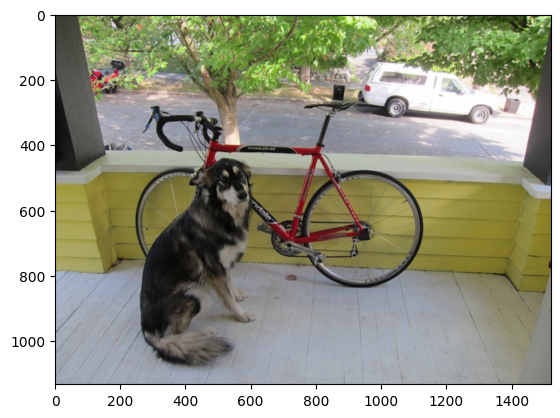

In [2]:
# 图片路径
image_path = 'images/dog.png' 
# 读取图片
image = cv2.imread(image_path)
# 将图像的 BGR 通道顺序转换为 RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
# 展示图片
plt.imshow(image_rgb)

In [3]:
# 模型路径
model_path = 'weights/yolo11n.pt'
# 加载模型
model = YOLO(model_path)
# 使用模型进行推理
results = model(image)
# 获取第一张图像的检测结果
detection_results = results[0]  


0: 480x640 1 bicycle, 1 car, 1 truck, 1 dog, 142.9ms
Speed: 5.0ms preprocess, 142.9ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


In [4]:
# 将Ultralytics的检测结果转换为Supervision的Detections对象
detections = sv.Detections.from_ultralytics(detection_results)

In [5]:
# 查看第一个物体的信息
detections[0]

Detections(xyxy=array([[     258.43,      440.74,      615.92,      1076.4]], dtype=float32), mask=None, confidence=array([    0.92522], dtype=float32), class_id=array([16]), tracker_id=None, data={'class_name': array(['dog'], dtype='<U7')}, metadata={})

In [20]:
# 查看检查物体的数量
len(detections)

4

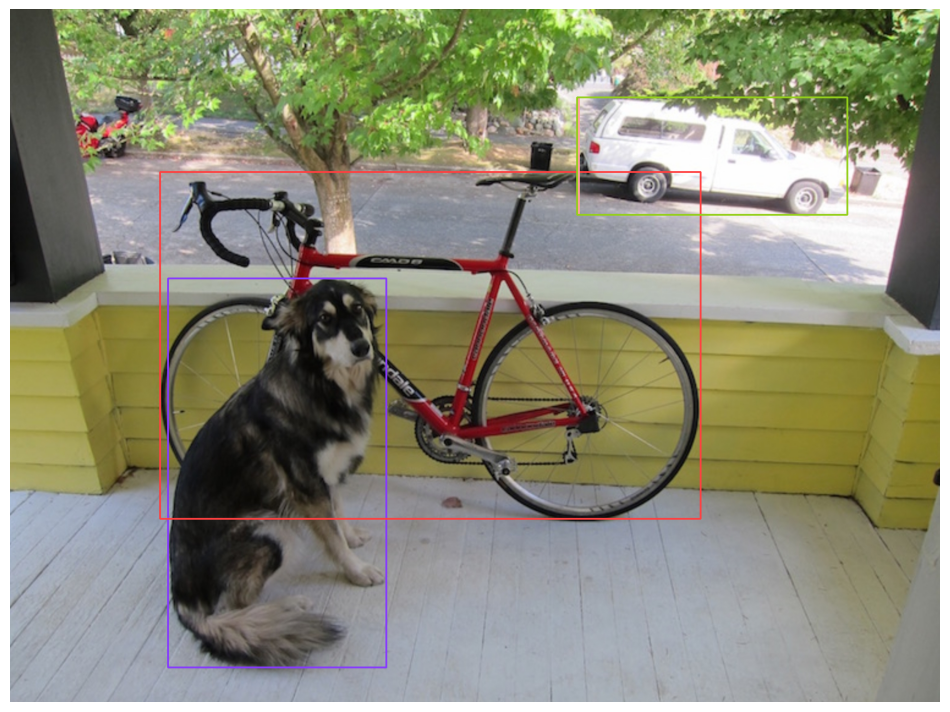

In [21]:
# 添加边框
# 实例化BoxAnnotator
box_annotator = sv.BoxAnnotator()
# 在原图添加边框
annotated_image = box_annotator.annotate(
    scene=image.copy(),
    detections=detections
)
# 图形展示
sv.plot_image(annotated_image)

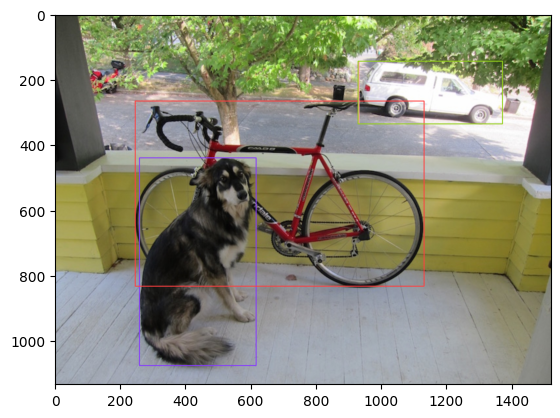

In [8]:
# 用Matplotlib绘图
annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
plt.imshow(annotated_image_rgb)

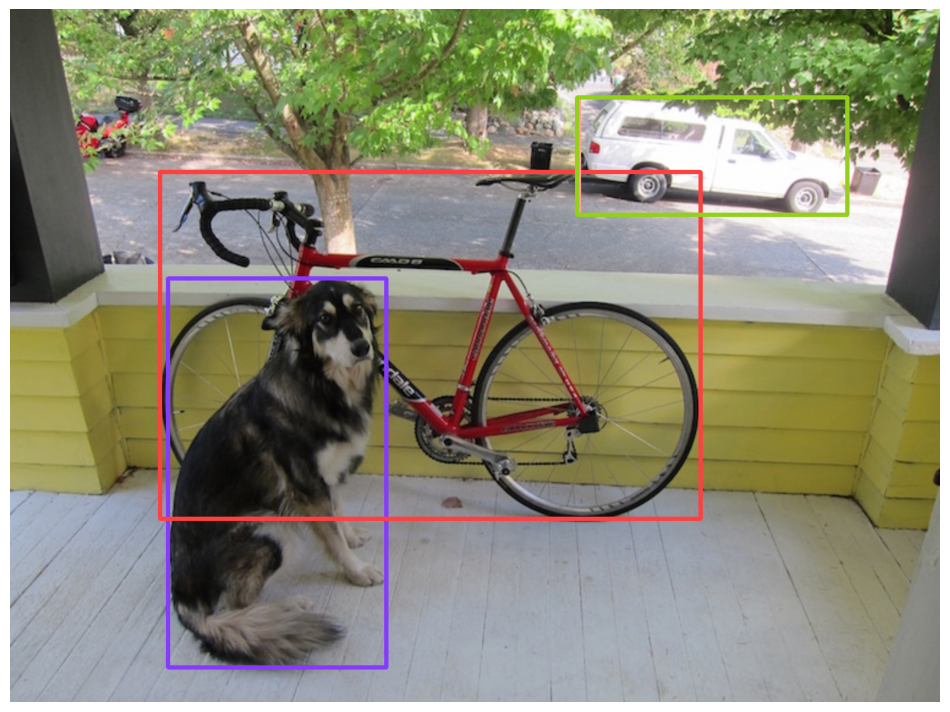

In [9]:
# 实例化BoxAnnotator，调整边框粗细
box_annotator1 = sv.BoxAnnotator(thickness=5)
# 在原图添加边框
annotated_image1 = box_annotator1.annotate(
    scene=image.copy(),
    detections=detections
)
# 图形展示
sv.plot_image(annotated_image1)

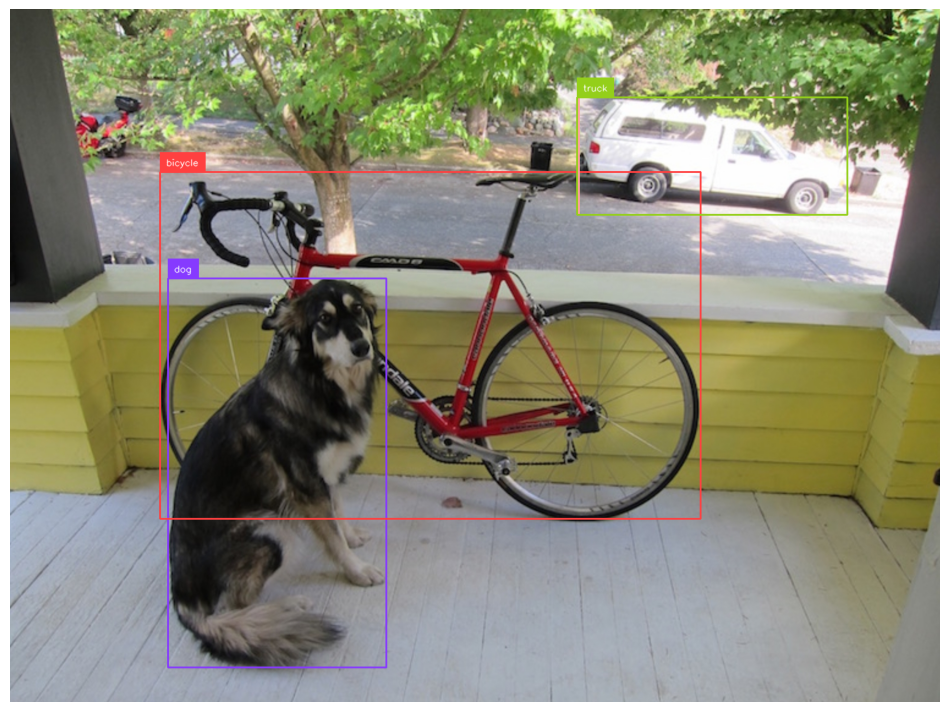

In [24]:
# 添加标签
# 实例化LabelAnnotator类
label_annotator = sv.LabelAnnotator()
# 创建标签列表
labels = [
    model.model.names[class_id]
    for class_id
    in detections.class_id
]
# 添加标签
annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections, labels=labels)
# 显示图形
sv.plot_image(annotated_image)

In [12]:
# 执行非极大值抑制
detections = detections.with_nms(threshold=0.5, class_agnostic=True)
# 打印输出结果
for class_id in detections.class_id:
    print(model.model.names[class_id])

dog
bicycle
car


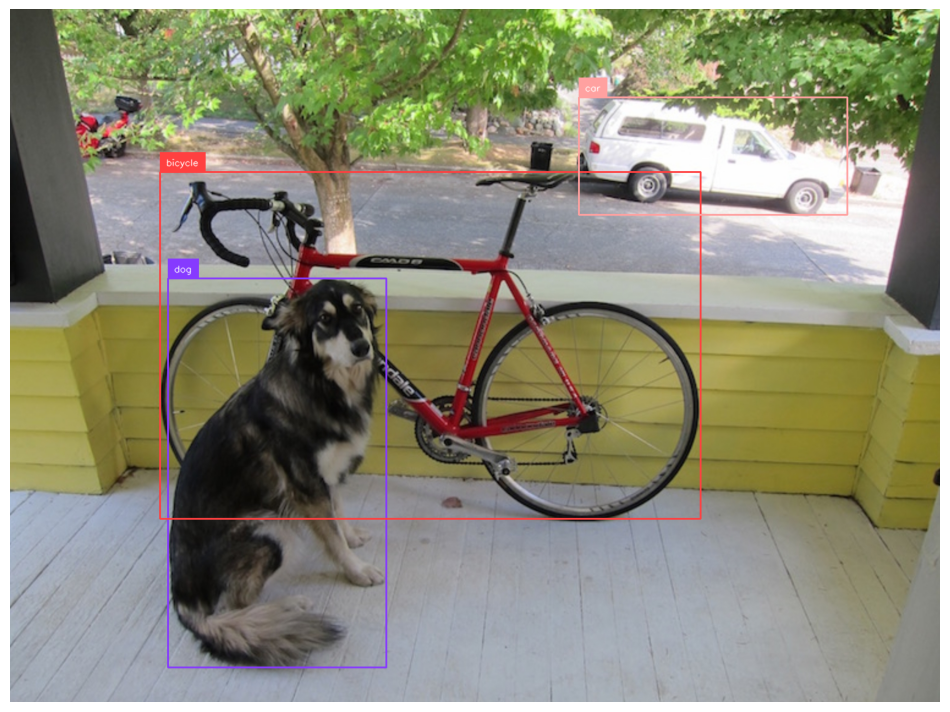

In [13]:
# 再次添加边框及标签
# 添加边框
box_annotator = sv.BoxAnnotator()
annotated_image = box_annotator.annotate(
    scene=image.copy(),
    detections=detections
)
# 添加标签
label_annotator = sv.LabelAnnotator()
labels = [
    model.model.names[class_id]
    for class_id
    in detections.class_id
]
annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections, labels=labels)
# 图形展示
sv.plot_image(annotated_image)

### 5.2 目标检测结果标注

In [42]:
# 图片路径
image_path = 'images/person.png' 
# 读取图片
image = cv2.imread(image_path)
# 模型路径
model_path = 'weights/yolo11m.pt'
# 加载模型
model = YOLO(model_path)
# 使用模型进行推理
results = model(image)
# 获取第一张图像的检测结果
detection_results = results[0]  
# 将Ultralytics的检测结果转换为Supervision的Detections对象
detections = sv.Detections.from_ultralytics(detection_results)


0: 352x640 26 persons, 2 handbags, 3 tennis rackets, 374.8ms
Speed: 5.0ms preprocess, 374.8ms inference, 2.0ms postprocess per image at shape (1, 3, 352, 640)


#### 5.2.1目标检测边框标注

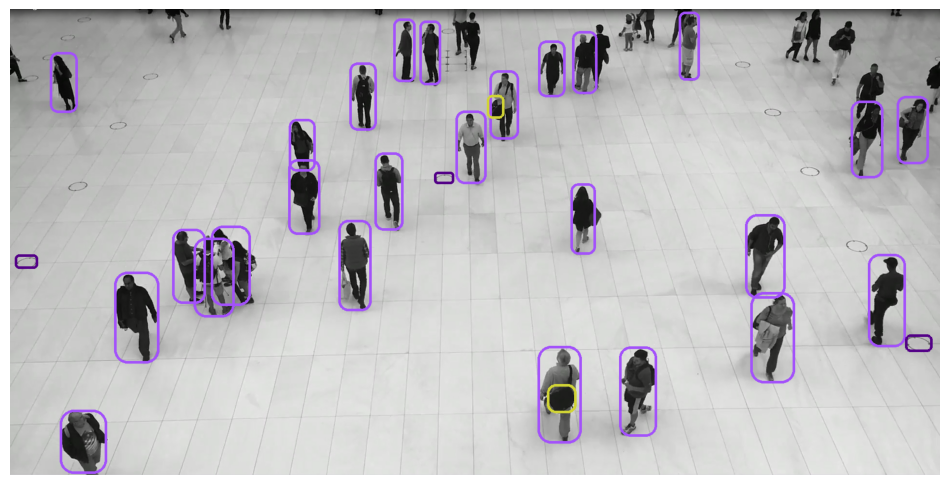

In [43]:
# roundness-边界框边缘的圆度百分比
round_box_annotator = sv.RoundBoxAnnotator(thickness=3)
 
annotated_image = round_box_annotator.annotate(
    scene=image.copy(),
    detections=detections
)
 
sv.plot_image(annotated_image)

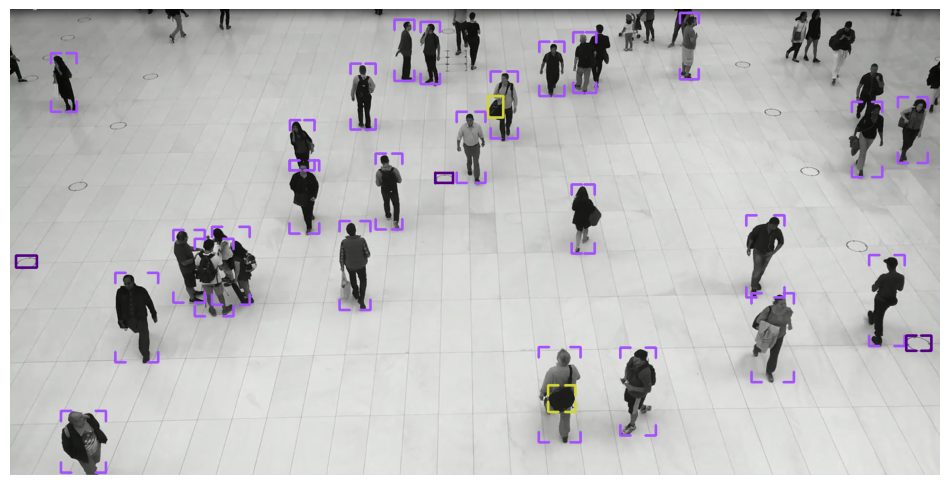

In [45]:
# corner_length-每个角线的长度，
corner_annotator = sv.BoxCornerAnnotator(thickness=4,corner_length=20)
annotated_image = corner_annotator.annotate(
    scene=image.copy(),
    detections=detections
)
sv.plot_image(annotated_image)

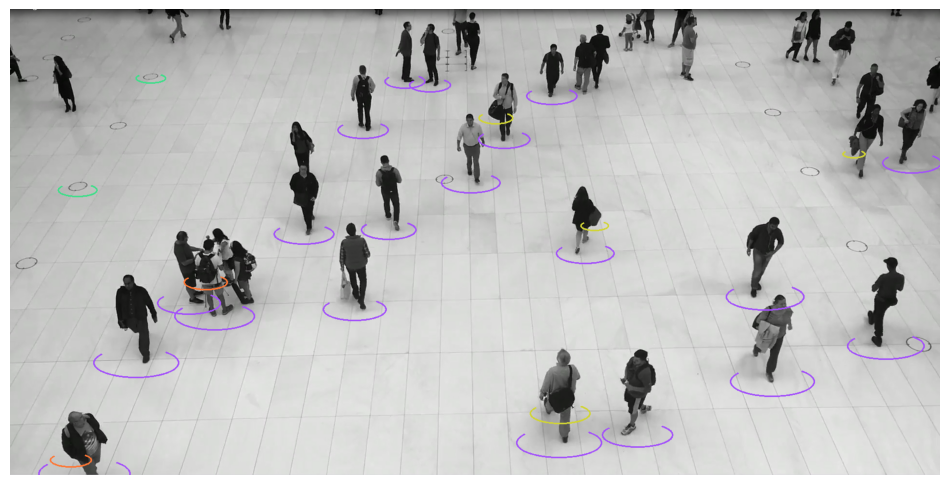

In [41]:
# start_angle表示椭圆的起始角度，默认为 - 45，顺时针为正方向；end_angle表示椭圆的结束角度，默认为235
corner_annotator = sv.EllipseAnnotator(start_angle=-45, end_angle=215)
annotated_image = corner_annotator.annotate(
    scene=image.copy(),
    detections=detections
)
sv.plot_image(annotated_image)

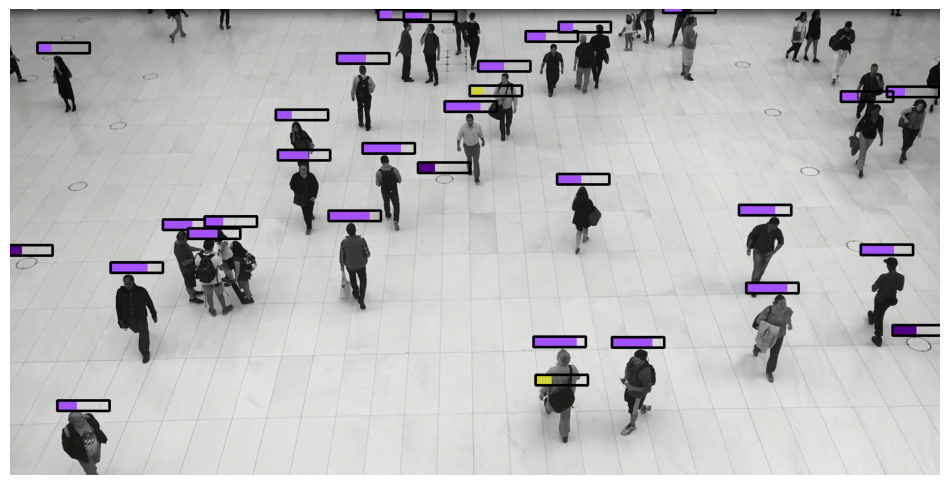

In [48]:
# 用于展示置信度百分比
# border_color-百分比条颜色
# position-位置
# width/height-百分比条宽/高
percentage_bar_annotator = sv.PercentageBarAnnotator(width = 100, height = 20)
annotated_image = percentage_bar_annotator.annotate(
    scene=image.copy(),
    detections=detections
)
sv.plot_image(annotated_image)

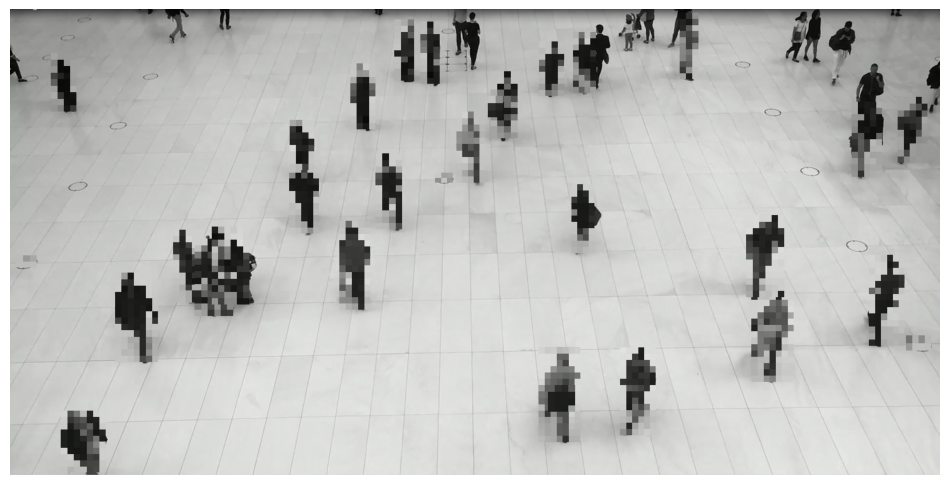

In [49]:
# pixel_size-像素化的大小。
pixelate_annotator = sv.PixelateAnnotator(pixel_size=12)
annotated_image = pixelate_annotator.annotate(
    scene=image.copy(),
    detections=detections
)
sv.plot_image(annotated_image)

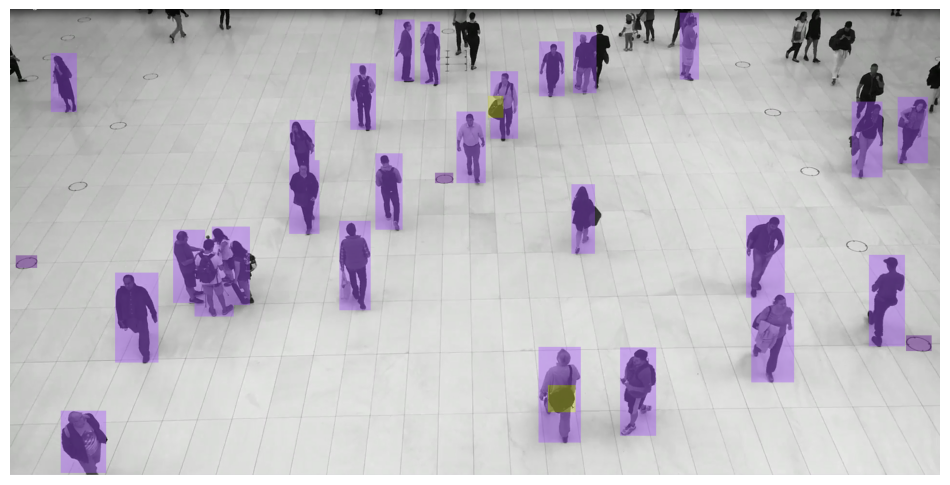

In [51]:
# opacity：颜色遮罩的不透明度
color_annotator = sv.ColorAnnotator(opacity=0.4)
annotated_image = color_annotator.annotate(
    scene=image.copy(),
    detections=detections
)
sv.plot_image(annotated_image)

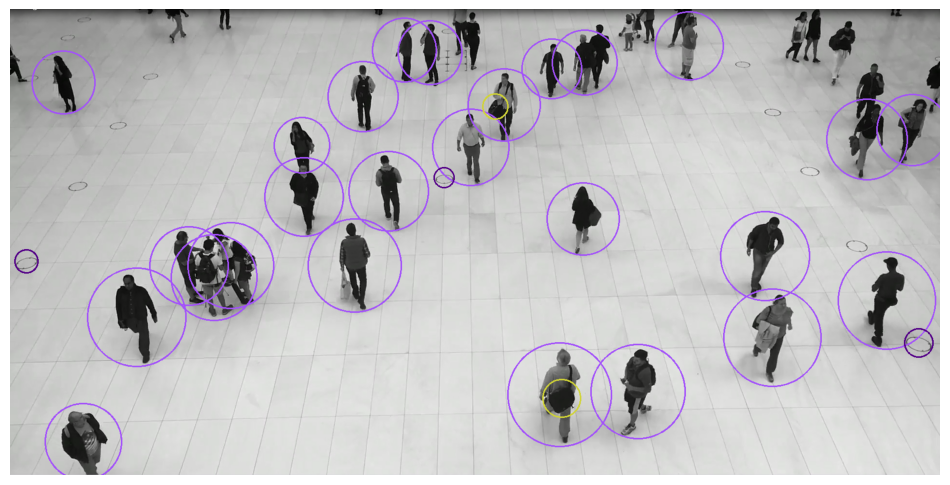

In [52]:
# 圆形边界框绘制
circle_annotator = sv.CircleAnnotator()
annotated_image = circle_annotator.annotate(
    scene=image.copy(),
    detections=detections
)
sv.plot_image(annotated_image)

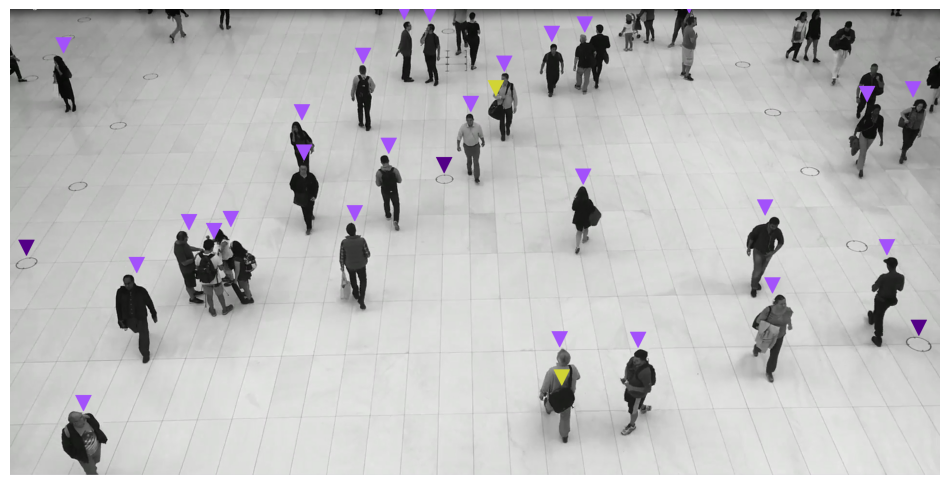

In [53]:
# 三角形标记绘制
# base/height-三角形的宽高，position-位置
triangle_annotator = sv.TriangleAnnotator(base = 30, height = 30)
annotated_image = triangle_annotator.annotate(
    scene=image.copy(),
    detections=detections
)
sv.plot_image(annotated_image)

#### 5.2.2 显示自定义标签

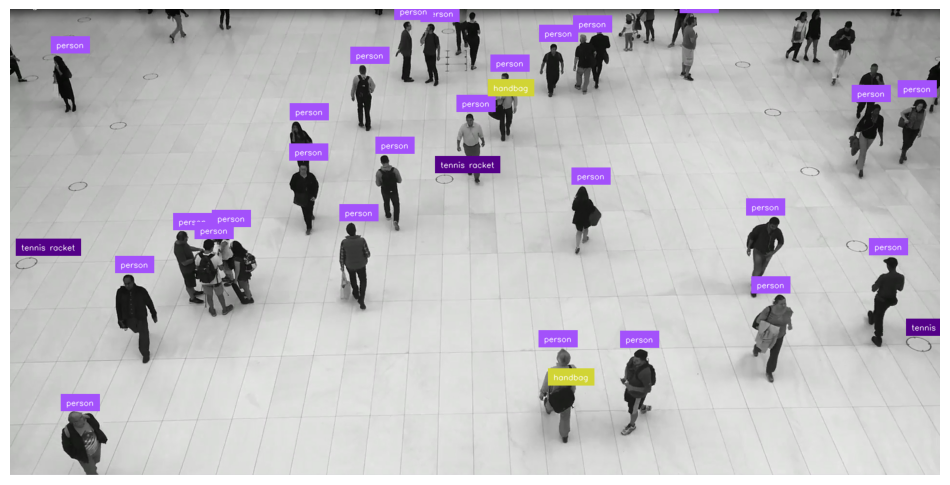

In [60]:
label_annotator = sv.LabelAnnotator()
 
# 获得各边界框的标签
labels = [
    model.model.names[class_id]
    for class_id
    in detections.class_id
]
 
annotated_image = label_annotator.annotate(
    scene=image.copy(),
    detections=detections,
    labels=labels
)
sv.plot_image(annotated_image)

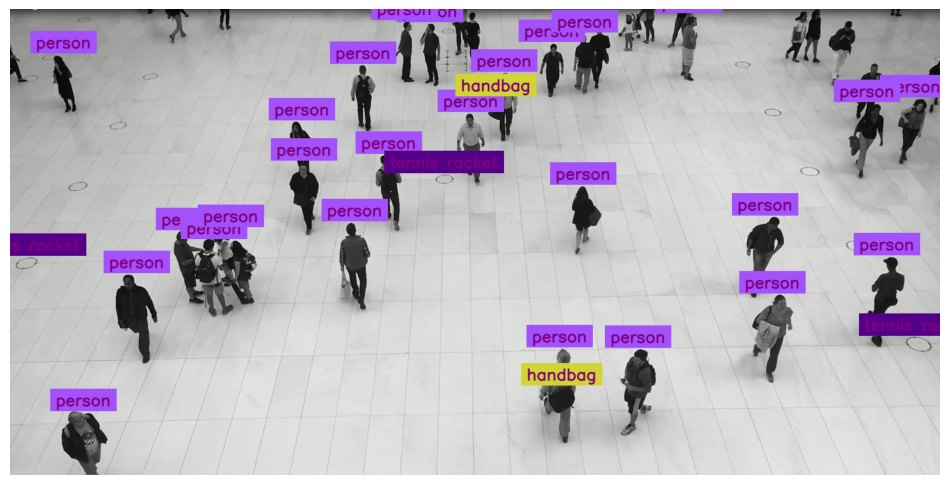

In [62]:
# text_color-文字颜色，text_scale-文字大小
# text_position-文字位置，text_thickness-文字粗细，text_padding-文字填充距离
label_annotator = sv.LabelAnnotator(text_color=sv.Color(r=128, g=0, b=128), 
                                    text_position=sv.Position.TOP_CENTER, 
                                    text_scale=1, text_thickness=2,text_padding=10)
 
# 获得各边界框的标签
labels = [
    model.model.names[class_id]
    for class_id
    in detections.class_id
]
 
annotated_image = label_annotator.annotate(
    scene=image.copy(),
    detections=detections,
    labels=labels
)
sv.plot_image(annotated_image)

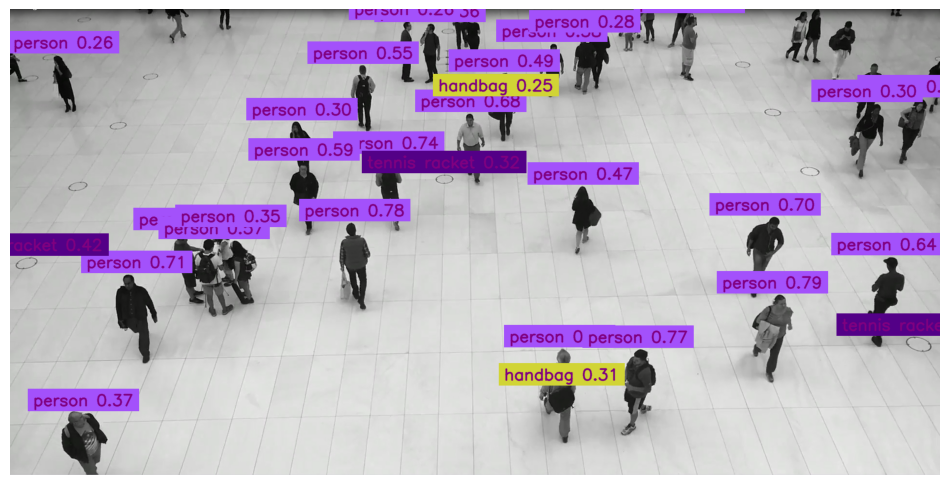

In [63]:
# 获得各边界框的标签及置信度
labels = [
    f"{class_name} {confidence:.2f}"
    for class_name, confidence
    in zip(detections['class_name'], detections.confidence)
]
 
annotated_image = label_annotator.annotate(
    scene=image.copy(),
    detections=detections,
    labels=labels
)
sv.plot_image(annotated_image)

### 5.3 视频处理的相关函数
#### 5.3.1 在线下载视频

In [3]:
from supervision.assets import download_assets, VideoAssets

In [5]:
import re
# 查看VideoAssets的属性
my_list = dir(VideoAssets)
# 定义正则表达式模式
pattern = re.compile(r'^__.*__$')
# 使用列表推导式过滤列表
filtered_list = [item for item in my_list if not pattern.match(item)]
# 打印结果
print(filtered_list)

['BASKETBALL', 'BEACH', 'GROCERY_STORE', 'MARKET_SQUARE', 'MILK_BOTTLING_PLANT', 'PEOPLE_WALKING', 'SKIING', 'SUBWAY', 'VEHICLES', 'VEHICLES_2']


In [7]:
# 下载一段行人走路的视频
download_assets(VideoAssets.PEOPLE_WALKING)

100%|██████████████████████████████████████████████████████████████████████████████| 7.25M/7.25M [00:11<00:00, 675kB/s]


'people-walking.mp4'

In [10]:
# 读取视频信息
# 读取视频文件的宽度、高度、fps和总帧数。
video_info = sv.VideoInfo.from_video_path(video_path="videos/people-walking.mp4")
video_info

VideoInfo(width=1920, height=1080, fps=25, total_frames=341)

#### 5.3.2 生成并保存视频

In [16]:
import supervision as sv
from tqdm import tqdm
video_path="videos/people-walking.mp4"
# 从源视频路径获取视频信息
video_info = sv.VideoInfo.from_video_path(video_path)
# 获取视频帧生成器
frames_generator = sv.get_video_frames_generator(source_path=video_path,
                                                 stride=10, start=0, end=100)
TARGET_VIDEO_PATH = "out.mp4"
# 使用VideoSink上下文管理器保存视频帧到目标路径
with sv.VideoSink(target_path=TARGET_VIDEO_PATH, video_info=video_info) as sink:
    for frame in tqdm(frames_generator):
        sink.write_frame(frame=frame) # 将每一帧写入到目标视频文件中

10it [00:01,  9.08it/s]


In [20]:
# # 将生成的视频保存为本地图片
# 获取视频帧生成器
frames_generator = sv.get_video_frames_generator(source_path=video_path,
                                                 stride=10, start=0, end=100)
# 将生成视频保存为图片
with sv.ImageSink(target_dir_path='output', overwrite=True) as sink:
    for image in frames_generator:
        sink.save_image(image=image)

In [23]:
# 将本地的视频保存为本地图片
with sv.ImageSink(target_dir_path='output', overwrite=True) as sink:
    for image in sv.get_video_frames_generator( source_path='out.mp4'):
        sink.save_image(image=image)

### 5.4 目标检测结果保存 
#### 5.4.1 保存为CSV文件

In [28]:
image = cv2.imread('images/person.png')
model = YOLO("yolo11n.pt")
results = model(image)
detection_results = results[0]
detections = sv.Detections.from_ultralytics(detection_results)


0: 640x640 27 persons, 1791.0ms
Speed: 128.9ms preprocess, 1791.0ms inference, 289.8ms postprocess per image at shape (1, 3, 640, 640)


In [30]:
# 保存为CSV文件
# 初始化CSV接收器，保存的CSV文件名称为detect_result.csv
csv_sink = sv.CSVSink('detect_result.csv')
# # 将检测结果和自定义数据追加到CSV文件中
with csv_sink as sink:
    sink.append(detections, custom_data={})

In [32]:
# 将视频每帧的检测结果保存到CSV文件
frames_generator = sv.get_video_frames_generator('out.mp4')

csv_sink = sv.CSVSink('video_result.csv')
with csv_sink as sink:
    for frame_index, frame in enumerate(frames_generator):
        # 对每一帧进行预测
        results = model(frame)[0]
        # 将预测结果转换为Detections对象
        detections = sv.Detections.from_ultralytics(results)
        # 将检测结果和自定义数据追加到CSV文件中
        sink.append(detections, {"frame_index": frame_index})


0: 384x640 16 persons, 231.9ms
Speed: 131.9ms preprocess, 231.9ms inference, 12.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 persons, 100.9ms
Speed: 6.0ms preprocess, 100.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 persons, 110.9ms
Speed: 5.0ms preprocess, 110.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 persons, 105.9ms
Speed: 4.0ms preprocess, 105.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 persons, 106.9ms
Speed: 5.0ms preprocess, 106.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 persons, 127.9ms
Speed: 4.0ms preprocess, 127.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 persons, 105.9ms
Speed: 4.0ms preprocess, 105.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 persons, 147.9ms
Speed: 6.0ms preprocess, 147.9ms inference, 3.0ms postp

#### 5.4.1 保存为JSON文件

In [34]:
# 将视频每帧的检测结果保存到JSON文件
frames_generator = sv.get_video_frames_generator('out.mp4')
# 初始化JSON接收器
json_sink = sv.JSONSink('video_result.json')
with json_sink as sink:
    for frame_index, frame in enumerate(frames_generator):
        results = model(frame)[0]
        detections = sv.Detections.from_ultralytics(results)
        sink.append(detections, {"frame_index": frame_index})


0: 384x640 16 persons, 131.9ms
Speed: 7.0ms preprocess, 131.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 persons, 100.9ms
Speed: 6.0ms preprocess, 100.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 persons, 100.9ms
Speed: 5.0ms preprocess, 100.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 persons, 126.9ms
Speed: 4.0ms preprocess, 126.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 persons, 151.9ms
Speed: 12.0ms preprocess, 151.9ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 persons, 120.9ms
Speed: 4.0ms preprocess, 120.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 persons, 173.9ms
Speed: 4.0ms preprocess, 173.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 persons, 100.9ms
Speed: 5.0ms preprocess, 100.9ms inference, 2.0ms postpro

### 5.5过滤目标检测结果
#### 5.5.1按指定类别过滤

In [2]:
image = cv2.imread('images/mix.png')
model = YOLO("yolo11n.pt")
results = model(image)
detection_results = results[0]


0: 640x640 1 person, 1 bicycle, 4 cars, 2 trucks, 3 cats, 175.9ms
Speed: 7.0ms preprocess, 175.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


In [37]:
print(model.model.names)

{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell phone', 68: 'microw

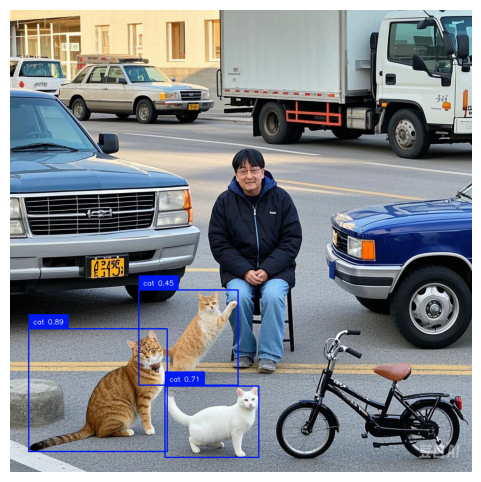

In [3]:
# 通过class_id==15过滤出cat
detections = sv.Detections.from_ultralytics(detection_results)
detections = detections[detections.class_id == 15] 

# 添加边框
box_annotator = sv.BoxAnnotator()
annotated_image = box_annotator.annotate(
    scene=image.copy(),
    detections=detections
)
# 添加标签
label_annotator = sv.LabelAnnotator()
labels = [
    f"{class_name} {confidence:.2f}"
    for class_name, confidence
    in zip(detections['class_name'], detections.confidence)
]
annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections, labels=labels)
# 显示图片
sv.plot_image(annotated_image,size=(6,6))

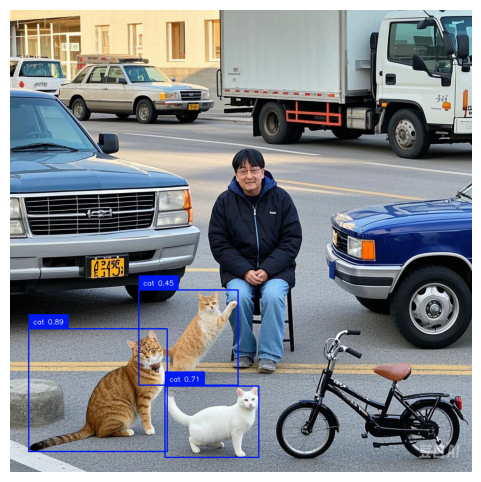

In [4]:
# class_name=='cat'过滤出cat
detections = sv.Detections.from_ultralytics(detection_results)
detections = detections[detections.data['class_name'] == 'cat'] 

# 添加边框
box_annotator = sv.BoxAnnotator()
annotated_image = box_annotator.annotate(
    scene=image.copy(),
    detections=detections
)
# 添加标签
label_annotator = sv.LabelAnnotator()
labels = [
    f"{class_name} {confidence:.2f}"
    for class_name, confidence
    in zip(detections['class_name'], detections.confidence)
]
annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections, labels=labels)
# 显示图片
sv.plot_image(annotated_image,size=(6,6))

#### 5.5.2 指定类别集合过滤

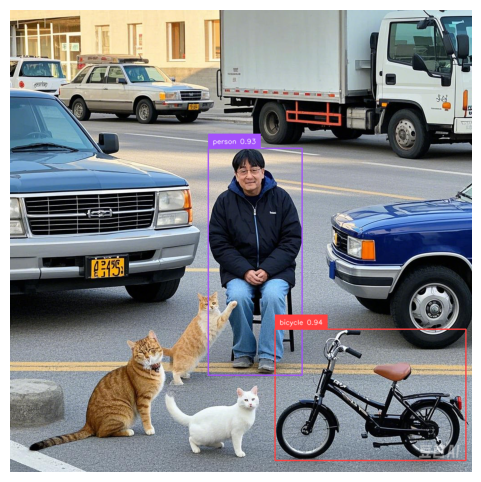

In [6]:
# 通过class_id过滤出
detections = sv.Detections.from_ultralytics(detection_results)
selected_classes = [0,1]
detections = detections[np.isin(detections.class_id,selected_classes)]

# 添加边框
box_annotator = sv.BoxAnnotator()
annotated_image = box_annotator.annotate(
    scene=image.copy(),
    detections=detections
)
# 添加标签
label_annotator = sv.LabelAnnotator()
labels = [
    f"{class_name} {confidence:.2f}"
    for class_name, confidence
    in zip(detections['class_name'], detections.confidence)
]
annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections, labels=labels)
# 显示图片
sv.plot_image(annotated_image,size=(6,6))

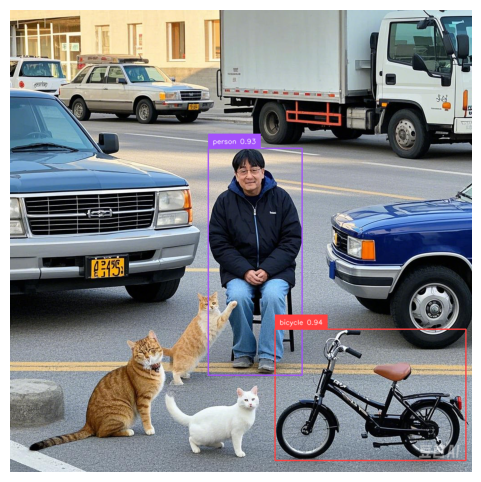

In [7]:
# 通过class_name过滤
detections = sv.Detections.from_ultralytics(detection_results)
selected_names = ['person', 'bicycle']
detections = detections[np.isin(detections.data['class_name'],selected_names)] 

# 添加边框
box_annotator = sv.BoxAnnotator()
annotated_image = box_annotator.annotate(
    scene=image.copy(),
    detections=detections
)
# 添加标签
label_annotator = sv.LabelAnnotator()
labels = [
    f"{class_name} {confidence:.2f}"
    for class_name, confidence
    in zip(detections['class_name'], detections.confidence)
]
annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections, labels=labels)
# 显示图片
sv.plot_image(annotated_image,size=(6,6))

#### 5.5.3按置信度过滤

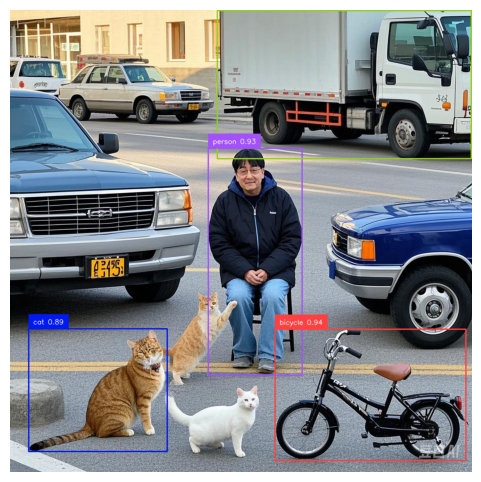

In [9]:
detections = sv.Detections.from_ultralytics(detection_results)
detections = detections[detections.confidence > 0.8]

# 添加边框
box_annotator = sv.BoxAnnotator()
annotated_image = box_annotator.annotate(
    scene=image.copy(),
    detections=detections
)
# 添加标签
label_annotator = sv.LabelAnnotator()
labels = [
    f"{class_name} {confidence:.2f}"
    for class_name, confidence
    in zip(detections['class_name'], detections.confidence)
]
annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections, labels=labels)
# 显示图片
sv.plot_image(annotated_image,size=(6,6))

#### 5.5.4按面积过滤

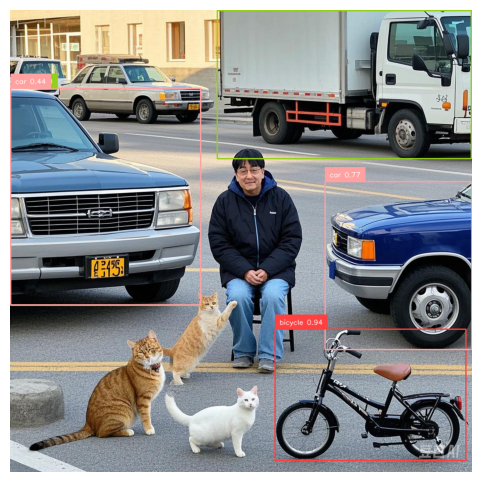

In [24]:
detections = sv.Detections.from_ultralytics(detection_results)
detections = detections[detections.area > 120000]

# 添加边框
box_annotator = sv.BoxAnnotator()
annotated_image = box_annotator.annotate(
    scene=image.copy(),
    detections=detections
)
# 添加标签
label_annotator = sv.LabelAnnotator()
labels = [
    f"{class_name} {confidence:.2f}"
    for class_name, confidence
    in zip(detections['class_name'], detections.confidence)
]
annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections, labels=labels)
# 显示图片
sv.plot_image(annotated_image,size=(6,6))

#### 5.5.5按相对面积过滤

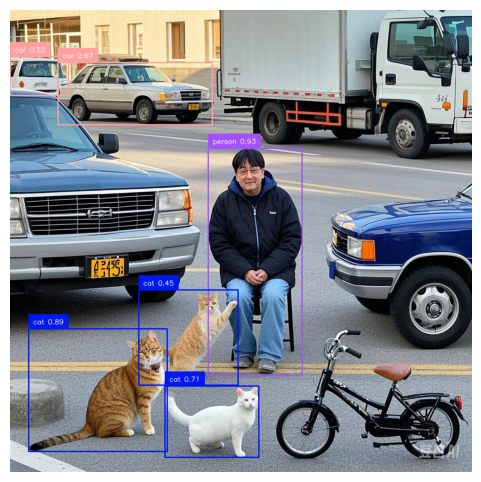

In [28]:
height, width, channels = image.shape
image_area = height * width

detections = sv.Detections.from_ultralytics(detection_results)
detections = detections[(detections.area / image_area) < 0.1]

c

#### 5.5.6按边界框过滤

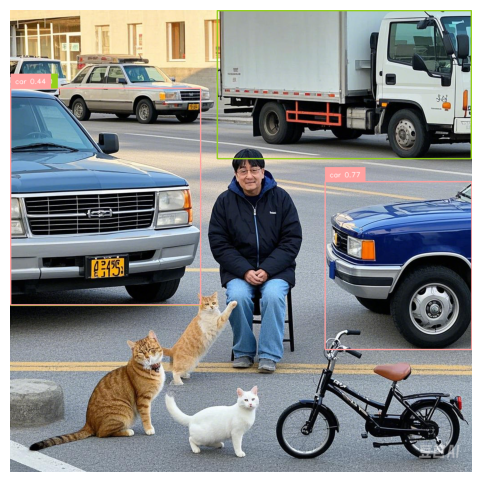

In [30]:
detections = sv.Detections.from_ultralytics(detection_results)

w = detections.xyxy[:, 2] - detections.xyxy[:, 0]
h = detections.xyxy[:, 3] - detections.xyxy[:, 1]
detections = detections[(w > 300) & (h > 300)]

# 添加边框
box_annotator = sv.BoxAnnotator()
annotated_image = box_annotator.annotate(
    scene=image.copy(),
    detections=detections
)
# 添加标签
label_annotator = sv.LabelAnnotator()
labels = [
    f"{class_name} {confidence:.2f}"
    for class_name, confidence
    in zip(detections['class_name'], detections.confidence)
]
annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections, labels=labels)
# 显示图片
sv.plot_image(annotated_image,size=(6,6))

#### 5.5.7按混合条件过滤

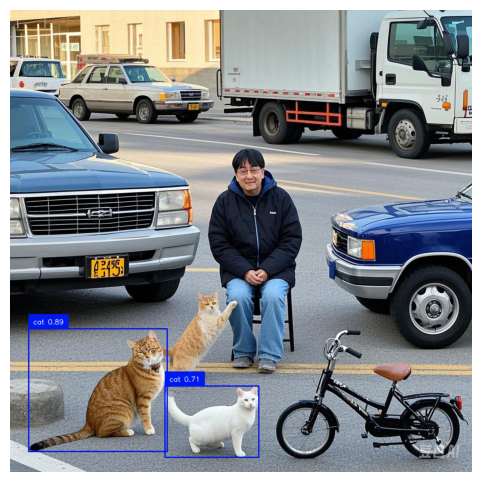

In [33]:
detections = sv.Detections.from_ultralytics(detection_results)
detections = detections[(detections.class_id == 15) & 
                        (detections.confidence > 0.7)] 

# 添加边框
box_annotator = sv.BoxAnnotator()
annotated_image = box_annotator.annotate(
    scene=image.copy(),
    detections=detections
)
# 添加标签
label_annotator = sv.LabelAnnotator()
labels = [
    f"{class_name} {confidence:.2f}"
    for class_name, confidence
    in zip(detections['class_name'], detections.confidence)
]
annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections, labels=labels)
# 显示图片
sv.plot_image(annotated_image,size=(6,6))